In [2]:
import mne
import scipy
import matplotlib.pyplot as plt
import seaborn as sns
import os
import re
import numpy as np
import pandas as pd
from mne.preprocessing import ICA
from mne.time_frequency import tfr_morlet
from matplotlib.gridspec import GridSpec

# Code to check 8-sec epochs of Tactile Imagery / Stimulation

In [32]:
folder = 'data/ID-29/3_imagery_wo_pulses_2/' 
vhdr = folder+[i for i in os.listdir(folder) if i[-4:]=='vhdr'][0]

Extracting parameters from data/gurgen/3_imagery_wo_pulses_2/NeoRec_2023-04-21_17-20-45.vhdr...
Setting channel info structure...
Reading 0 ... 160893  =      0.000 ...   321.786 secs...
Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.2 - 40 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 0.20
- Lower transition bandwidth: 0.20 Hz (-6 dB cutoff frequency: 0.10 Hz)
- Upper passband edge: 40.00 Hz
- Upper transition bandwidth: 10.00 Hz (-6 dB cutoff frequency: 45.00 Hz)
- Filter length: 8251 samples (16.502 sec)



<ipython-input-33-34f18b2ea84a>:1: RuntimeWarning: Limited 1 annotation(s) that were expanding outside the data range.
  raw = mne.io.read_raw_brainvision(vhdr)
<ipython-input-33-34f18b2ea84a>:7: RuntimeWarning: No bad channels to interpolate. Doing nothing...
  raw = raw.copy().interpolate_bads()
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.0s remaining:    0.0s


Fitting ICA to data using 47 channels (please be patient, this may take a while)


[Parallel(n_jobs=1)]: Done  47 out of  47 | elapsed:    0.1s finished


Selecting by number: 15 components
Fitting ICA took 2.2s.


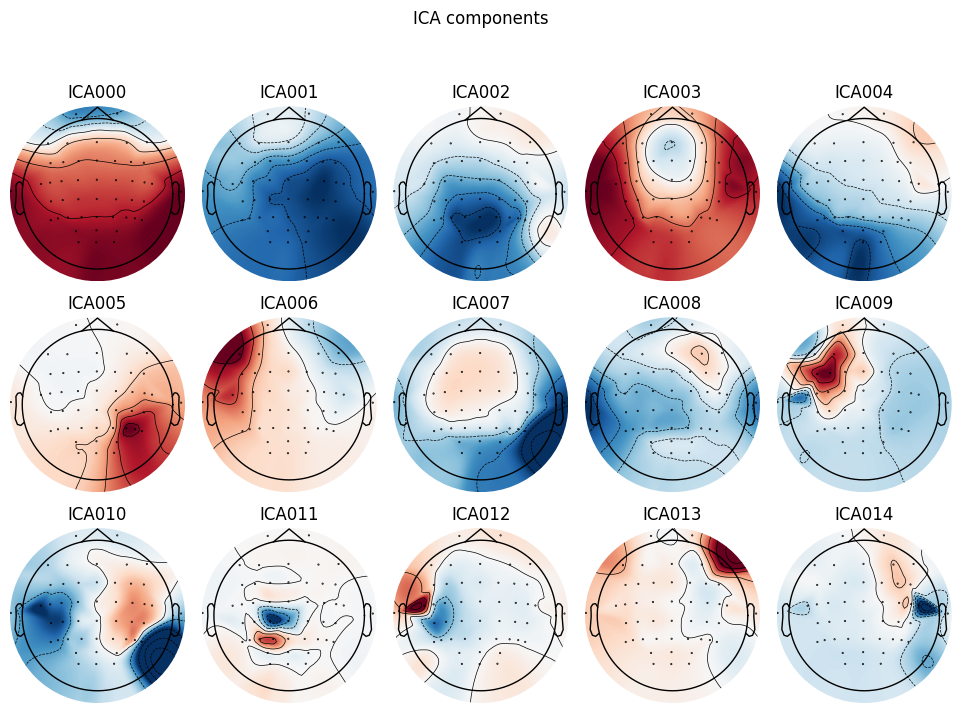

Applying ICA to Raw instance
    Transforming to ICA space (15 components)
    Zeroing out 1 ICA component
    Projecting back using 47 PCA components


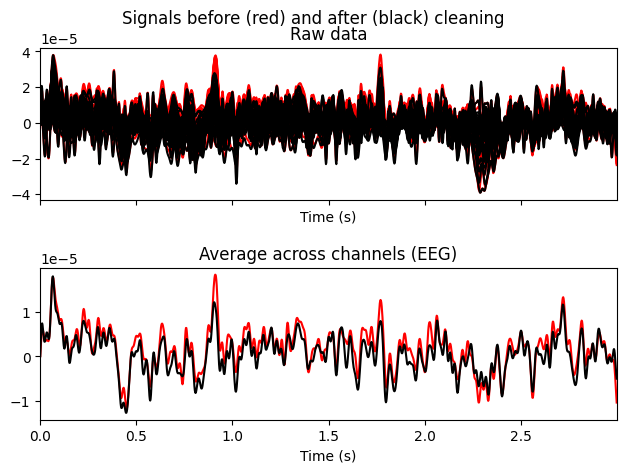

Applying ICA to Raw instance
    Transforming to ICA space (15 components)
    Zeroing out 1 ICA component
    Projecting back using 47 PCA components
EEG channel type selected for re-referencing
Applying average reference.
Applying a custom ('EEG',) reference.


In [33]:
raw = mne.io.read_raw_brainvision(vhdr)
raw.load_data()

montage = mne.channels.make_standard_montage('standard_1020')
raw.set_montage(montage)
raw.info['bads'] = []
raw = raw.copy().interpolate_bads()

raw.filter(l_freq=0.2, h_freq=40)

ica = ICA(n_components=15, max_iter='auto', random_state=97)
ica.fit(raw)
ica.plot_components()
ica.plot_overlay(raw, exclude=[0], picks='eeg')
ica.exclude = [0]

raw = ica.apply(raw)
raw = raw.set_eeg_reference(ref_channels='average')

events, _ = mne.events_from_annotations(raw, verbose=False)
events = events[2:-1]


tmin, tmax = 0, 8
baseline = None
epochs = mne.Epochs(
    raw, events=events,
    event_id=[10002, 10003], tmin=tmin,
    tmax=tmax, baseline=baseline, verbose=False, reject={'eeg':2e-4})

In [34]:
epochs

Number of events,30
Events,10002: 1510003: 15
Time range,0.000 – 8.000 sec
Baseline,off


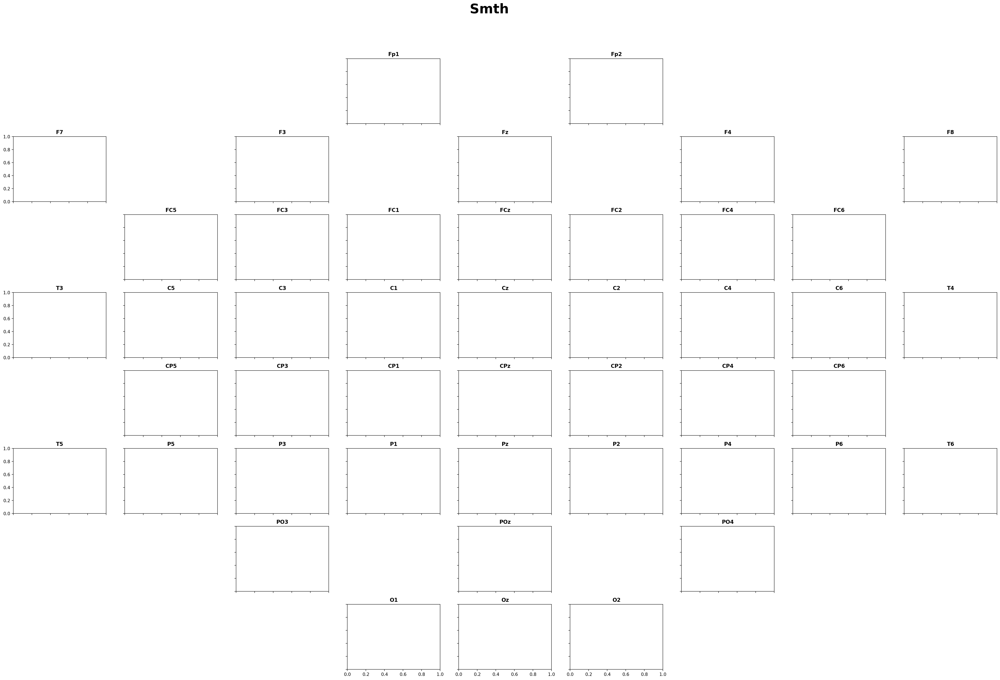

In [14]:
electrodes = epochs.ch_names
t = epochs.times

dict_rows = {
    'Fp':0,
    'F':1,
    'FC':2,
    'T':-1,
    'A':-1,
    'C':3,
    'CP':4,
    'P':5,
    'PO':6,
    'O':7,
}

dict_cols = {
    '7':0,
    '5':1,
    '3':2,
    '1':3,
    'z':4,
    '2':5,
    '4':6,
    '6':7,
    '8':8
}

cols_seq = [dict_cols[re.split('(\d+)', i)[1]] if 'z' not in i else dict_cols[i[-1]] for i in electrodes]
rows_seq = [dict_rows[re.split('(\d+)', i)[0]] if 'z' not in i else dict_rows[i[:-1]] for i in electrodes]

cols_seq[electrodes.index('T3')] = 0
rows_seq[electrodes.index('T3')] = 3
cols_seq[electrodes.index('T4')] = 8
rows_seq[electrodes.index('T4')] = 3

cols_seq[electrodes.index('T5')] = 0
rows_seq[electrodes.index('T5')] = 5
cols_seq[electrodes.index('T6')] = 8
rows_seq[electrodes.index('T6')] = 5

nrows = max(rows_seq)+1
ncols = max(cols_seq)+1

figure, axes = plt.subplots(nrows=nrows, ncols=ncols, figsize=(40, 25), sharex=True, sharey=True, dpi=200)

for e in range(len(electrodes)):
    if electrodes[e] in ['A1', 'A2']:
        continue
    axes[rows_seq[e]][cols_seq[e]].set_title(electrodes[e], fontsize=12, fontweight='bold')
    
pairs = [str(rows_seq[i])+str(cols_seq[i]) for i in range(len(electrodes))]
    
for row in range(nrows):
    for col in range(ncols):
        if str(row) + str(col) not in pairs:
            axes[row][col].set_axis_off()

# figure.subplots_adjust(right=0.8)
# cbar_ax = figure.add_axes([0.83, 0.3, 0.02, 0.4])
# cbar = figure.colorbar(cp, cax=cbar_ax)
# cbar.ax.set_title('power')
            
plt.suptitle('Smth', fontsize=30, y=0.95, fontweight='bold')
plt.show()

Using data from preloaded Raw for 15 events and 4001 original time points ...
0 bad epochs dropped
Not setting metadata
Using data from preloaded Raw for 15 events and 4001 original time points ...
0 bad epochs dropped
Not setting metadata


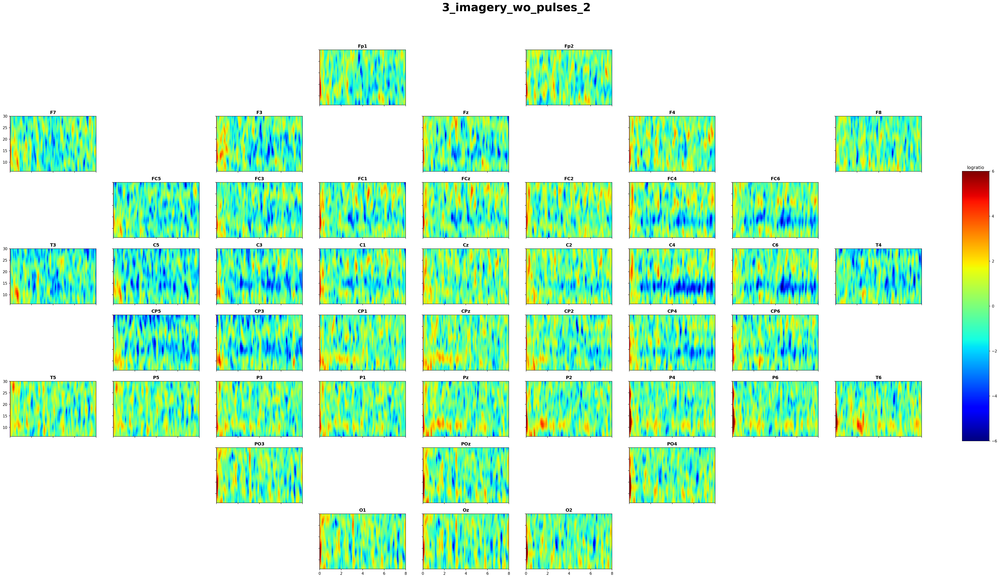

In [21]:
freqs = np.arange(6,31)
n_cycles = freqs / 2 # use constant t/f resolution
power_smr = mne.time_frequency.tfr_morlet(epochs['10003'], freqs=freqs, n_cycles=n_cycles, use_fft=True,decim=1,
n_jobs=1,average=False,return_itc=0)
power_rst = mne.time_frequency.tfr_morlet(epochs['10002'], freqs=freqs, n_cycles=n_cycles, use_fft=True,decim=1,
n_jobs=1,average=False,return_itc=0)

erd = 10*np.log10(power_smr.data.mean(axis=0)/power_rst.data.mean(axis=0).mean(axis=2)[:, :, None])

figure, axes = plt.subplots(nrows=nrows, ncols=ncols, figsize=(50, 25), sharex=True, sharey=True, dpi=150)

for e in range(len(electrodes)):
    if electrodes[e] in ['A1', 'A2']:
        continue
    cp = axes[rows_seq[e]][cols_seq[e]].pcolormesh(t[::10], freqs, erd[e, :, ::10], vmin=-6, vmax=6, cmap=plt.cm.jet, shading='gouraud')
    axes[rows_seq[e]][cols_seq[e]].set_title(electrodes[e], fontsize=12, fontweight='bold')
    axes[rows_seq[e]][cols_seq[e]].axvline(0, color='tab:red')
    
pairs = [str(rows_seq[i])+str(cols_seq[i]) for i in range(len(electrodes))]
    
for row in range(nrows):
    for col in range(ncols):
        if str(row) + str(col) not in pairs:
            axes[row][col].set_axis_off()

figure.subplots_adjust(right=0.8)
cbar_ax = figure.add_axes([0.83, 0.3, 0.02, 0.4])
cbar = figure.colorbar(cp, cax=cbar_ax)
cbar.ax.set_title('logratio')
            
plt.suptitle(folder.split('/')[-2], fontsize=30, y=0.95, fontweight='bold')
plt.show()

# Code to check 1.5 sec Event-Related Potentials

In [ ]:
folder = 'data/ID-29/1_finger_75/' 
vhdr = folder+[i for i in os.listdir(folder) if i[-4:]=='vhdr'][0]

Extracting parameters from data/gurgen/1_finger_75/NeoRec_2023-04-21_16-55-11.vhdr...
Setting channel info structure...
Reading 0 ... 101951  =      0.000 ...   203.902 secs...
Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.2 - 10 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 0.20
- Lower transition bandwidth: 0.20 Hz (-6 dB cutoff frequency: 0.10 Hz)
- Upper passband edge: 10.00 Hz
- Upper transition bandwidth: 2.50 Hz (-6 dB cutoff frequency: 11.25 Hz)
- Filter length: 8251 samples (16.502 sec)



<ipython-input-29-76dfdb64402f>:7: RuntimeWarning: No bad channels to interpolate. Doing nothing...
  raw = raw.copy().interpolate_bads()
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.0s remaining:    0.0s


Fitting ICA to data using 47 channels (please be patient, this may take a while)


[Parallel(n_jobs=1)]: Done  47 out of  47 | elapsed:    0.1s finished


Selecting by number: 15 components
Fitting ICA took 1.7s.


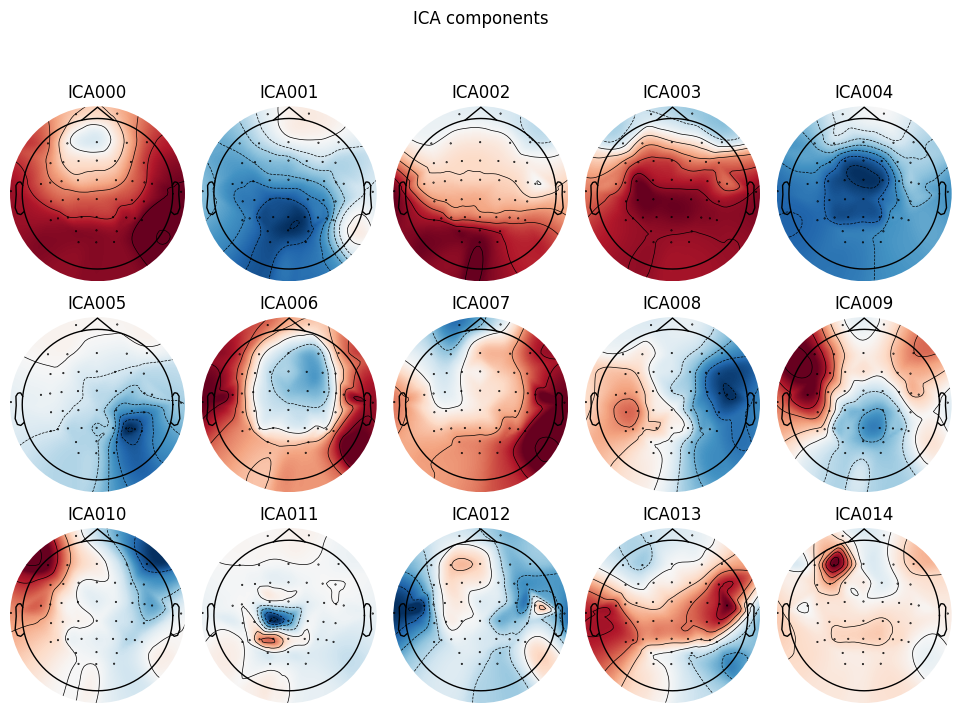

Applying ICA to Raw instance
    Transforming to ICA space (15 components)
    Zeroing out 2 ICA components
    Projecting back using 47 PCA components


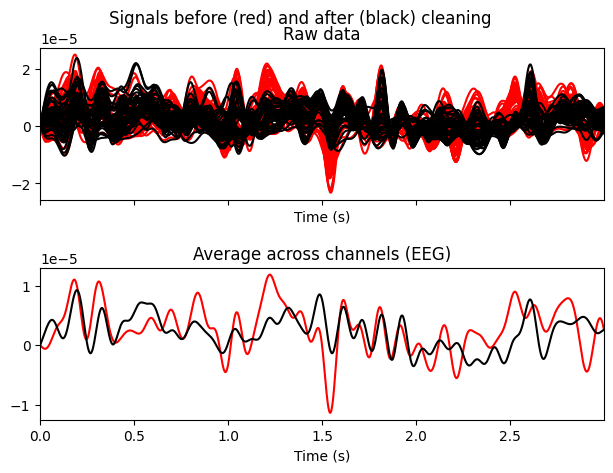

Applying ICA to Raw instance
    Transforming to ICA space (15 components)
    Zeroing out 2 ICA components
    Projecting back using 47 PCA components
EEG channel type selected for re-referencing
Applying a custom ('EEG',) reference.


In [29]:
raw = mne.io.read_raw_brainvision(vhdr)
raw.load_data()

montage = mne.channels.make_standard_montage('standard_1020')
raw.set_montage(montage)
raw.info['bads'] = []
raw = raw.copy().interpolate_bads()

raw.filter(l_freq=0.2, h_freq=10)

ica = ICA(n_components=15, max_iter='auto', random_state=97)
ica.fit(raw)
ica.plot_components()
ica.plot_overlay(raw, exclude=[0, 1], picks='eeg')
ica.exclude = [0, 1]

raw = ica.apply(raw)
raw = raw.set_eeg_reference(ref_channels=['A1', 'A2'])

events, _ = mne.events_from_annotations(raw, verbose=False)
events = events[2:-1]
events = events[::2]
events = events[-100:]

tmin, tmax = -0.5, 1
baseline = (-0.5, 0)
epochs = mne.Epochs(
    raw, events=events,
    event_id=[10002], tmin=tmin,
    tmax=tmax, baseline=baseline, verbose=False) #, reject={'eeg':25e-5})

In [30]:
epochs

Number of events,100
Events,10002: 100
Time range,-0.500 – 1.000 sec
Baseline,-0.500 – 0.000 sec


No projector specified for this dataset. Please consider the method self.add_proj.


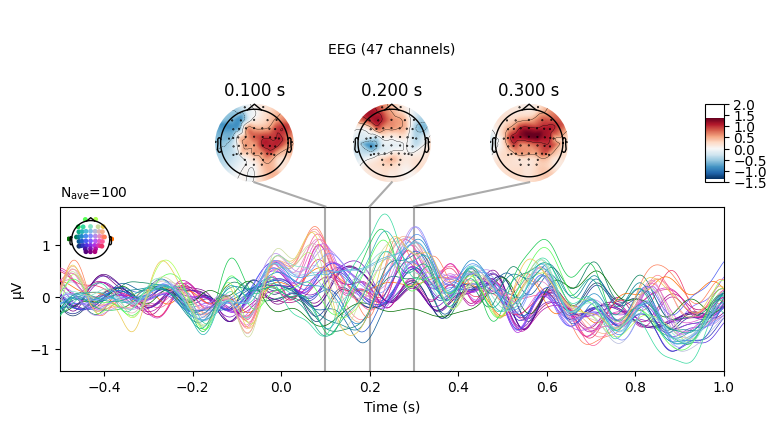

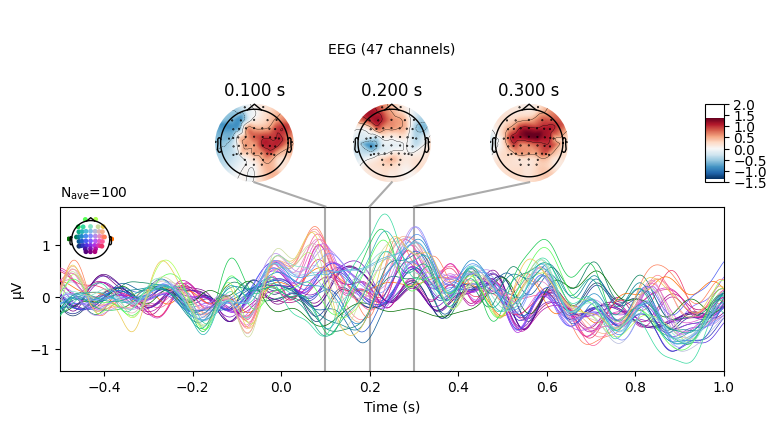

In [31]:
epochs.average().plot_joint([0.1, 0.2, 0.3])